# Measure proximity to water bodies

We have water bodies as surface water and as coastline. We want to measure whether there is water within 1200m.

In [1]:
import os

import geopandas as gpd

from sqlalchemy import create_engine

user = os.environ.get('DB_USER')
pwd = os.environ.get('DB_PWD')
host = os.environ.get('DB_HOST')
port = os.environ.get('DB_PORT')

db_connection_url = f"postgres+psycopg2://{user}:{pwd}@{host}:{port}/built_env"
engine = create_engine(db_connection_url)

In [2]:
chunk = 51
gdf = gpd.read_parquet(f'../../urbangrammar_samba/spatial_signatures/tessellation/tess_{chunk}.pq')

In [3]:
b = gdf.total_bounds
b

array([332971.42423159, 379462.03      , 361675.        , 404701.        ])

In [4]:
sql = f'SELECT * FROM gb_coastline_2016 WHERE ST_Intersects(geometry, ST_MakeEnvelope({b[0]}, {b[1]}, {b[2]}, {b[3]}, 27700))'
coastline = gpd.read_postgis(sql, engine, geom_col='geometry')

In [5]:
sql = f'SELECT * FROM openmap_surfacewater_area_200824 WHERE ST_Intersects(geometry, ST_MakeEnvelope({b[0]}, {b[1]}, {b[2]}, {b[3]}, 27700))'
water = gpd.read_postgis(sql, engine, geom_col='geometry')

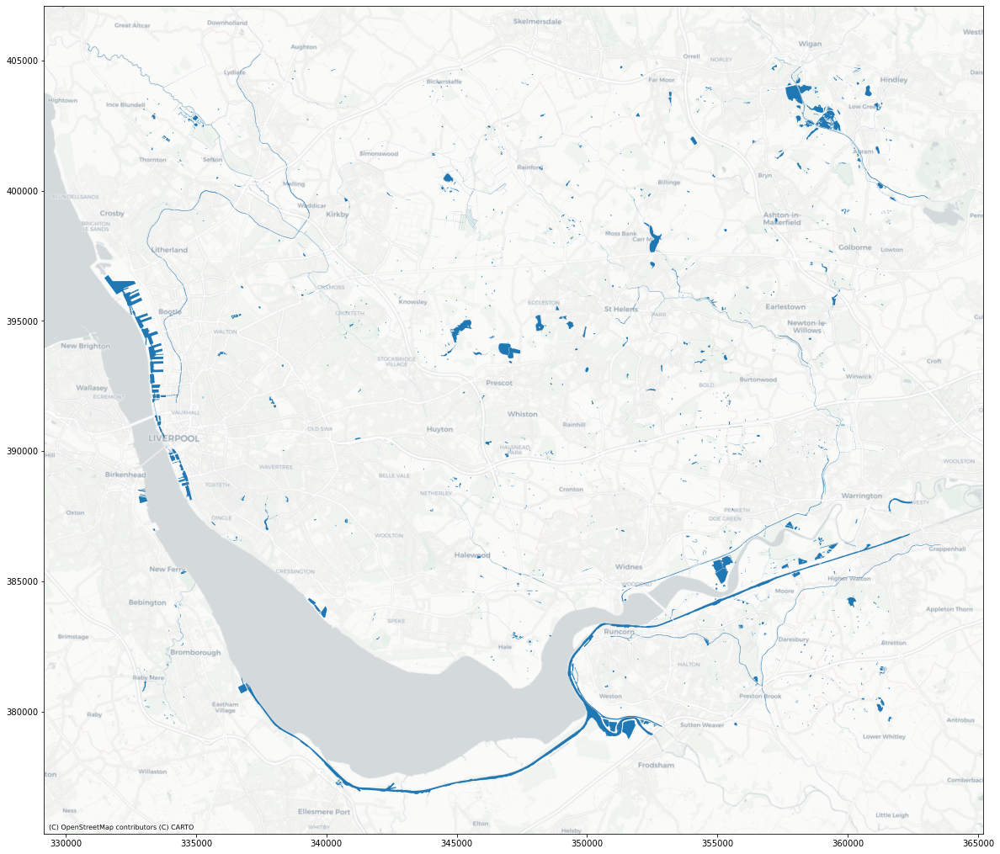

In [7]:
import contextily as ctx
ax = water.plot(figsize=(20, 20))
ctx.add_basemap(ax=ax, crs=water.crs, source=ctx.providers.CartoDB.Positron)

In [8]:
from shapely.geometry import box
from shapely.ops import polygonize

sql = f'SELECT * FROM gb_coastline_2016'
coastline = gpd.read_postgis(sql, engine, geom_col='geometry')

polys = polygonize(coastline.geometry)
land = gpd.GeoSeries(polys, crs=27700)
sea = box(*land.total_bounds).difference(land.geometry.unary_union)

In [104]:
target = water.geometry

In [106]:
target = gpd.clip(target, box(*b))

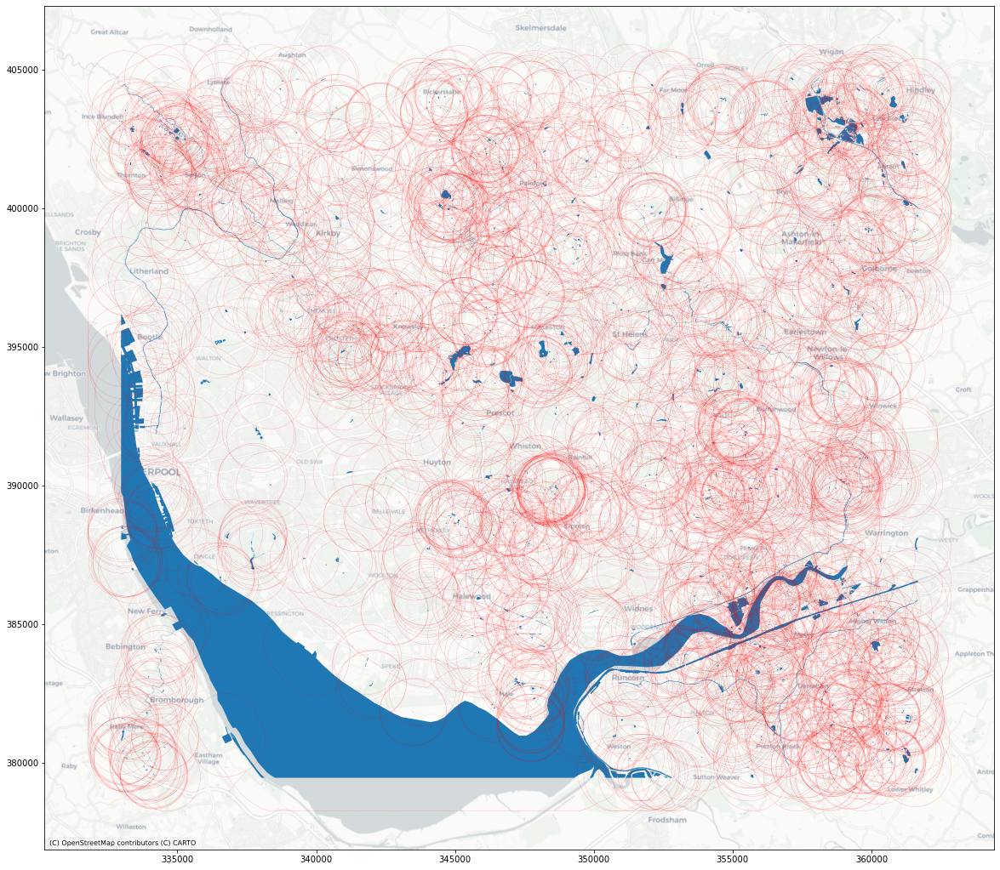

In [107]:
ax = target.plot(figsize=(20, 20))
target.buffer(1200).boundary.plot(ax=ax, linewidth=.1, color='r')
ctx.add_basemap(ax=ax, crs=water.crs, source=ctx.providers.CartoDB.Positron)

## Measure presence

In [134]:
%time buffered = gdf.tessellation.buffer(1200)

CPU times: user 9.19 s, sys: 32.3 ms, total: 9.22 s
Wall time: 9.15 s


In [135]:
%time inp_water, res_buff = buffered.sindex.query_bulk(target.geometry, predicate='intersects')

CPU times: user 7.37 s, sys: 39.6 ms, total: 7.41 s
Wall time: 7.38 s


In [136]:
%time ints = buffered.iloc[res_buff].reset_index(drop=True).intersection(target.iloc[inp_water].reset_index(drop=True))

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:27700
Right CRS: None

  """Entry point for launching an IPython kernel.


CPU times: user 1min 31s, sys: 670 ms, total: 1min 31s
Wall time: 1min 31s


In [137]:
%time gdf['areas'] = ints.area.groupby(res_buff).sum()

CPU times: user 442 ms, sys: 222 µs, total: 442 ms
Wall time: 439 ms


In [139]:
%time gdf['areas'] = gdf['areas'].fillna(0)

CPU times: user 3.91 ms, sys: 95 µs, total: 4 ms
Wall time: 2.5 ms


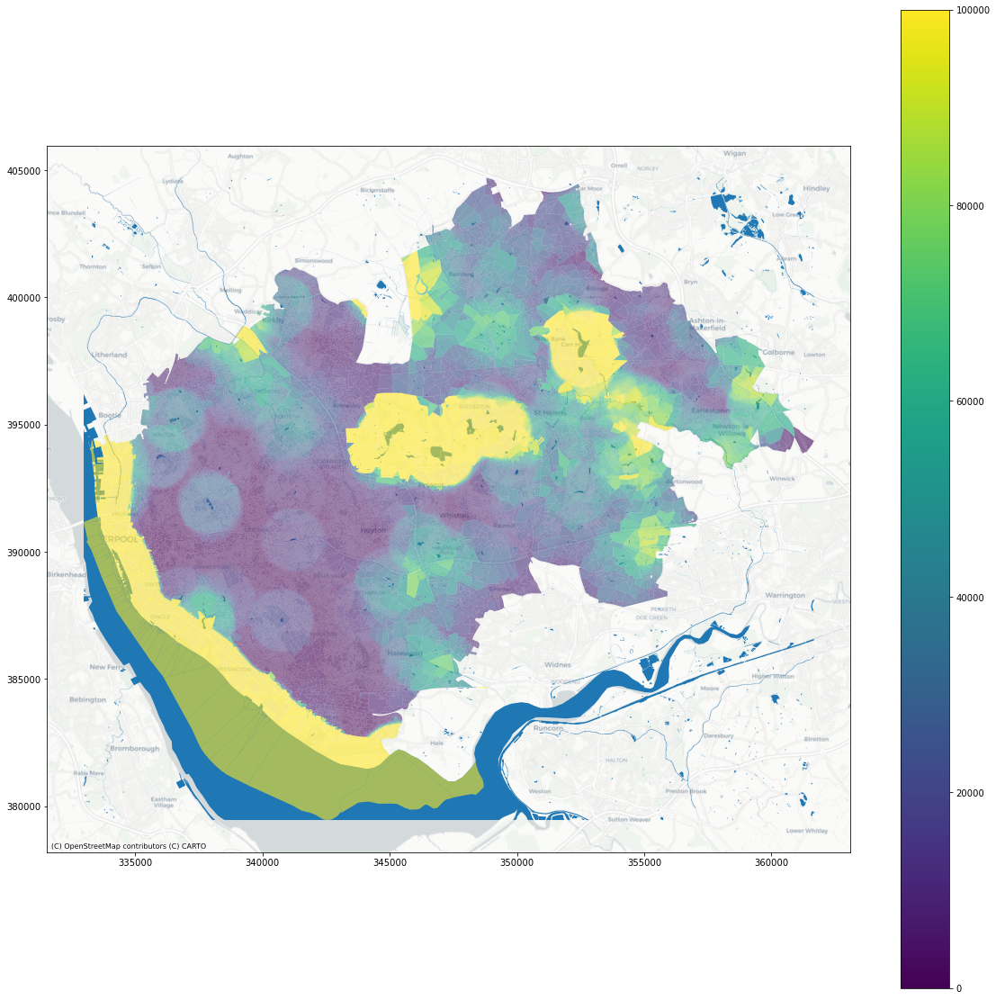

In [159]:
ax = target.plot(figsize=(20, 20))
gdf.plot('areas', ax=ax, alpha=.6, legend=True, vmax=100000)
ctx.add_basemap(ax=ax, crs=water.crs, source=ctx.providers.CartoDB.Positron)

In [147]:
%time inverse = ints.area * 1/ints.distance(gdf.tessellation.iloc[res_buff].reset_index(drop=True))

CPU times: user 2min 35s, sys: 218 ms, total: 2min 35s
Wall time: 2min 35s


In [148]:
inverse.shape

(1426486,)

In [149]:
res_buff.shape

(1426486,)

In [150]:
%time gdf['inverse'] = inverse.groupby(res_buff).sum()
%time gdf['inverse'] = gdf['inverse'].fillna(0)

CPU times: user 49.9 ms, sys: 3.96 ms, total: 53.9 ms
Wall time: 52.2 ms
CPU times: user 1.59 ms, sys: 32 µs, total: 1.62 ms
Wall time: 1.43 ms


/opt/conda/lib/python3.7/site-packages/mapclassify/classifiers.py:857: RuntimeWarning: invalid value encountered in subtract
  css = yc - yc.mean()
/opt/conda/lib/python3.7/site-packages/mapclassify/classifiers.py:879: RuntimeWarning: invalid value encountered in subtract
  ycd = np.abs(yc - yc_med)


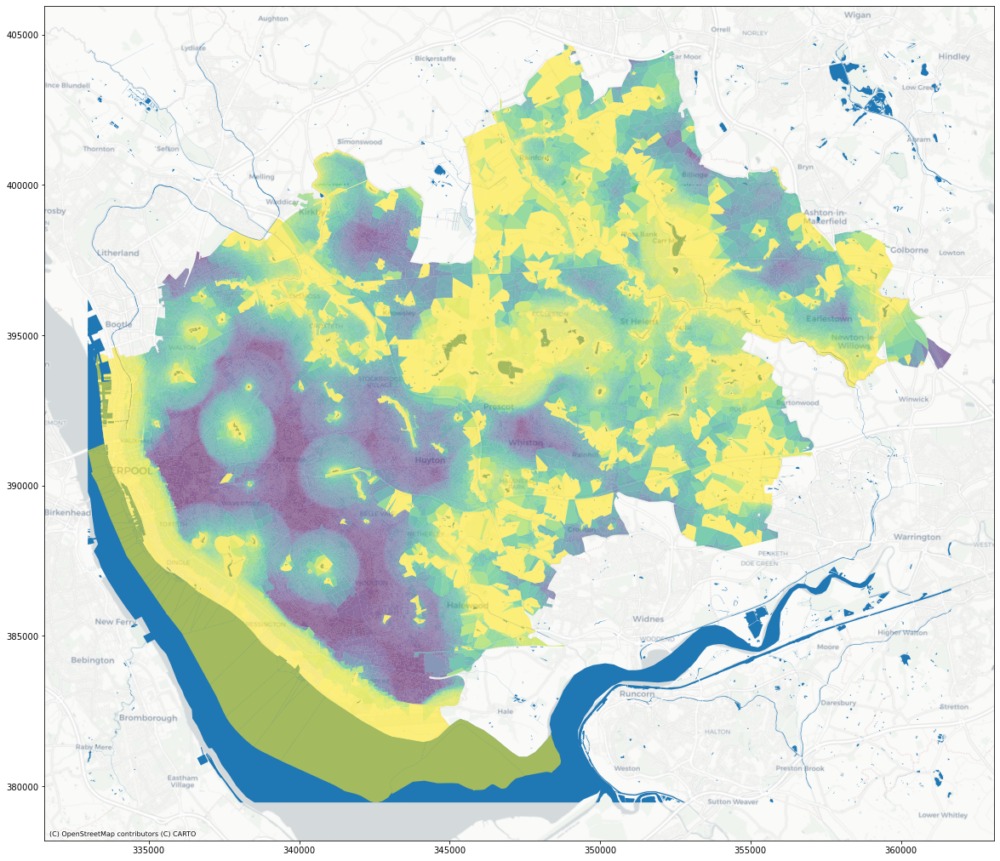

In [155]:
ax = target.plot(figsize=(20, 20))
gdf.plot('inverse', ax=ax, alpha=.6, scheme='quantiles', k=20)
ctx.add_basemap(ax=ax, crs=water.crs, source=ctx.providers.CartoDB.Positron)

## distance to nearest

In [162]:
from tqdm import tqdm

In [193]:
initial_buffer = 1000
buffered = gdf.tessellation.buffer(initial_buffer)
distance = []
for orig, geom in tqdm(zip(gdf.tessellation, buffered.geometry), total=len(buffered)):
    query = target.sindex.query(geom, predicate='intersects')
    b = initial_buffer
    while query.size == 0:
        query = target.sindex.query(geom.buffer(b), predicate='intersects')
        b += initial_buffer
    
    distance.append(target.iloc[query].distance(orig).min())

100%|██████████| 121188/121188 [03:25<00:00, 590.30it/s] 


In [194]:
gdf['dist_nearest'] = distance

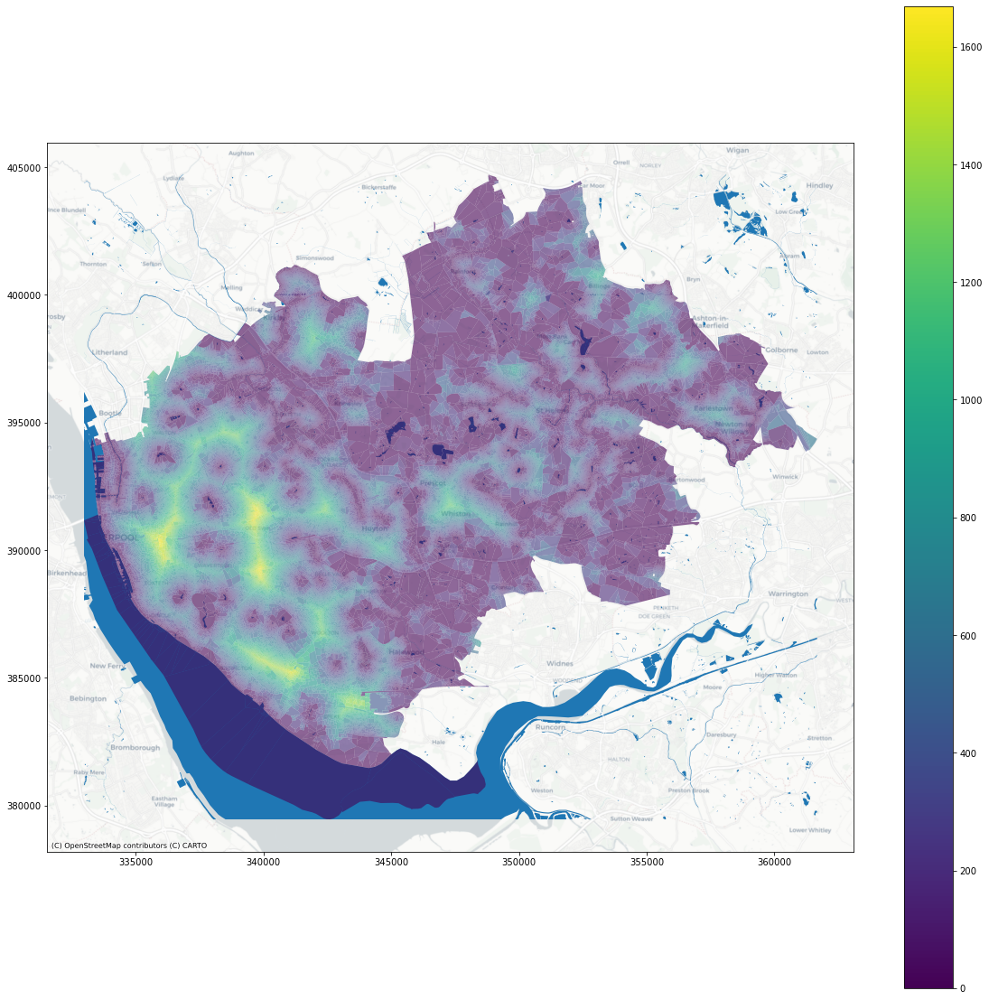

In [195]:
ax = target.plot(figsize=(20, 20))
gdf.plot('dist_nearest', ax=ax, alpha=.6, legend=True)
ctx.add_basemap(ax=ax, crs=water.crs, source=ctx.providers.CartoDB.Positron)

In [181]:
mask = gdf.tessellation.loc[gdf['dist_nearest'].idxmax()].buffer(2500)

In [182]:
sample = gpd.clip(gdf, mask)

<AxesSubplot:>

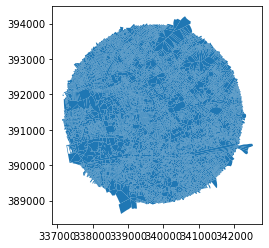

In [183]:
sample.plot()

In [191]:
initial_buffer = 200
buffered = sample.tessellation.buffer(initial_buffer)
distance = []
for orig, geom in tqdm(zip(sample.tessellation, buffered.geometry), total=len(buffered)):
    query = target.sindex.query(geom, predicate='intersects')
    b = initial_buffer
    while query.size == 0:
        query = target.sindex.query(geom.buffer(b), predicate='intersects')
        b += initial_buffer
    
    distance.append(target.iloc[query].distance(orig).min())

100%|██████████| 12965/12965 [00:14<00:00, 913.49it/s] 


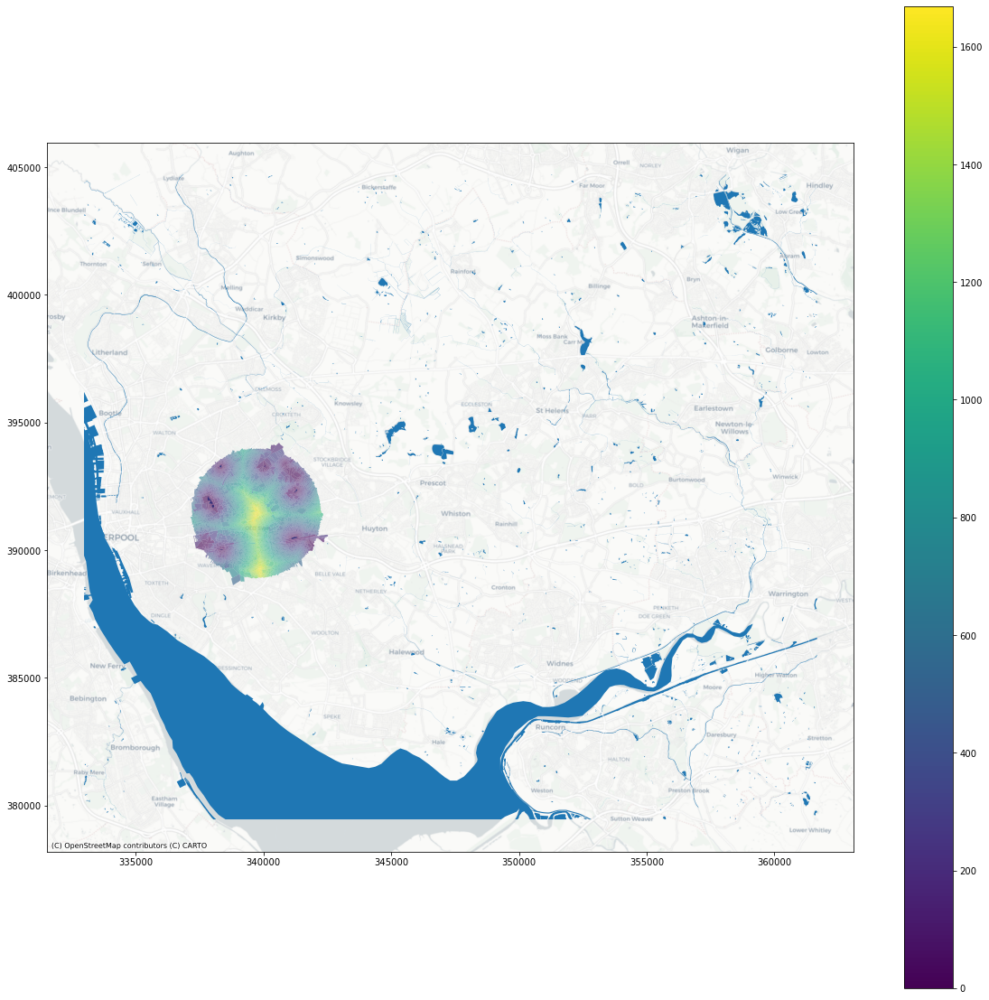

In [192]:
sample['dist_nearest'] = distance
ax = target.plot(figsize=(20, 20))
sample.plot('dist_nearest', ax=ax, alpha=.6, legend=True)
ctx.add_basemap(ax=ax, crs=water.crs, source=ctx.providers.CartoDB.Positron)

In [196]:
from dask.distributed import Client

client = Client(n_workers=15)

In [197]:
def nearest(orig, geom):
    query = target.sindex.query(geom, predicate='intersects')
    b = initial_buffer
    while query.size == 0:
        query = target.sindex.query(geom.buffer(b), predicate='intersects')
        b += initial_buffer
    return target.iloc[query].distance(orig).min()

In [202]:
from dask import delayed
from dask import compute

In [203]:
buffered = sample.tessellation.buffer(initial_buffer)

distance = []

for orig, geom in zip(sample.tessellation, buffered.geometry):
    y = delayed(nearest)(orig, geom)
    
    distance.append(y)

In [204]:
%%time
r = compute(distance)

distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker
distributed.nanny - WARNING - Restarting worker


KeyboardInterrupt: 